In [89]:
from pyspark import SQLContext, SparkConf, SQLContext, sql
from pyspark.sql import functions
import matplotlib.pyplot as mpy 
mpy.style.use('ggplot')
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.offline import plot
from plotly.graph_objs import *
import plotly.offline as py
import plotly.graph_objs as go
init_notebook_mode()
import pandas as pd
import requests
import cufflinks as cf
import numpy as np
import random
from pyspark.ml.feature import StringIndexer

In [23]:
import sys
print (sys.version)
import pip
installed_packages = pip.get_installed_distributions()
installed_packages_list = sorted(["%s==%s" % (i.key, i.version)
     for i in installed_packages])
print(installed_packages_list)

2.7.11 |Anaconda 4.0.0 (x86_64)| (default, Dec  6 2015, 18:57:58) 
[GCC 4.2.1 (Apple Inc. build 5577)]
['alabaster==0.7.7', 'anaconda-client==1.4.0', 'anaconda-navigator==1.1.0', 'appnope==0.1.0', 'appscript==1.0.1', 'argcomplete==1.0.0', 'astropy==1.1.2', 'babel==2.2.0', 'backports-abc==0.4', 'backports.ssl-match-hostname==3.4.0.2', 'beautifulsoup4==4.4.1', 'bitarray==0.8.1', 'blaze==0.9.1', 'bokeh==0.11.1', 'boto==2.39.0', 'bottleneck==1.0.0', 'cdecimal==2.3', 'cffi==1.5.2', 'chest==0.2.3', 'cloudpickle==0.1.1', 'clyent==1.2.1', 'colorama==0.3.7', 'colorlover==0.2.1', 'conda-build==0+unknown', 'conda-env==2.4.5', 'conda-manager==0.3.1', 'conda==4.0.5', 'configobj==5.0.6', 'cryptography==1.3', 'cufflinks==0.7.2', 'cycler==0.10.0', 'cython==0.23.4', 'cytoolz==0.7.5', 'dask==0.8.1', 'datashape==0.5.1', 'decorator==4.0.9', 'dill==0.2.4', 'docutils==0.12', 'dynd==0.7.3.dev1', 'enum34==1.1.2', 'et-xmlfile==1.0.1', 'fastcache==1.0.2', 'flask-cors==2.1.2', 'flask==0.10.1', 'funcsigs==0.4', '

In [33]:
df = spark.read.csv("/Users/EM186023/Documents/Tools/Spark/spark-2.0.0-preview-bin-hadoop2.7/data/mllib/sample_tree_data.csv")
df_beers = spark.read.csv("/Users/EM186023/Documents/Tools/Spark/spark-2.0.0-preview-bin-hadoop2.7/data/mllib/beer_reviews.csv", header='true')
df_gdp_pd = pd.read_csv('https://plot.ly/~etpinard/191.csv')
#df_gdp = spark.createDataFrame(df_gdp_pd)

df_beers.count()
df.count()

569

In [38]:
#f_gdp = spark.createDataFrame(df_gdp_pd,)
df_gdp_pd.dtypes
#df_gdp_pd[continent+'_Life Expentancy [in years]']

Africa_Life Expentancy [in years]                                       float64
Africa_text                                                              object
Africa_marker.size                                                      float64
Africa_Gross Domestic Product per Capita [in USD of the year 2000]      float64
Americas_Life Expentancy [in years]                                     float64
Americas_text                                                            object
Americas_marker.size                                                    float64
Americas_Gross Domestic Product per Capita [in USD of the year 2000]    float64
Asia_Life Expentancy [in years]                                         float64
Asia_text                                                                object
Asia_marker.size                                                        float64
Asia_Gross Domestic Product per Capita [in USD of the year 2000]        float64
Europe_Life Expentancy [in years]       

In [4]:
print(type(df_beers))
df_beers.printSchema()
df_beers.take(3)

<class 'pyspark.sql.dataframe.DataFrame'>
root
 |-- brewery_id: string (nullable = true)
 |-- brewery_name: string (nullable = true)
 |-- review_time: string (nullable = true)
 |-- review_overall: string (nullable = true)
 |-- review_aroma: string (nullable = true)
 |-- review_appearance: string (nullable = true)
 |-- review_profilename: string (nullable = true)
 |-- beer_style: string (nullable = true)
 |-- review_palate: string (nullable = true)
 |-- review_taste: string (nullable = true)
 |-- beer_name: string (nullable = true)
 |-- beer_abv: string (nullable = true)
 |-- beer_beerid: string (nullable = true)



[Row(brewery_id=u'10325', brewery_name=u'Vecchio Birraio', review_time=u'1234817823', review_overall=u'1.5', review_aroma=u'2', review_appearance=u'2.5', review_profilename=u'stcules', beer_style=u'Hefeweizen', review_palate=u'1.5', review_taste=u'1.5', beer_name=u'Sausa Weizen', beer_abv=u'5', beer_beerid=u'47986'),
 Row(brewery_id=u'10325', brewery_name=u'Vecchio Birraio', review_time=u'1235915097', review_overall=u'3', review_aroma=u'2.5', review_appearance=u'3', review_profilename=u'stcules', beer_style=u'English Strong Ale', review_palate=u'3', review_taste=u'3', beer_name=u'Red Moon', beer_abv=u'6.2', beer_beerid=u'48213'),
 Row(brewery_id=u'10325', brewery_name=u'Vecchio Birraio', review_time=u'1235916604', review_overall=u'3', review_aroma=u'2.5', review_appearance=u'3', review_profilename=u'stcules', beer_style=u'Foreign / Export Stout', review_palate=u'3', review_taste=u'3', beer_name=u'Black Horse Black Beer', beer_abv=u'6.5', beer_beerid=u'48215')]

In [4]:
df_1 = df_beers.where(df_beers.review_overall.isNotNull()).select(df_beers.review_overall)
df_1.printSchema()
df_to_pandas = df_1.groupBy("review_overall").count().orderBy("review_overall").toPandas()
string_indexer = StringIndexer(inputCol='review_overall', outputCol='review_overall_num')
df_2 = string_indexer.fit(df_1).transform(df_1)
df_2.printSchema()
df_beers = string_indexer.fit(df_beers).transform(df_beers)
df_beers.printSchema()

root
 |-- review_overall: string (nullable = true)

root
 |-- review_overall: string (nullable = true)
 |-- review_overall_num: double (nullable = true)

root
 |-- brewery_id: string (nullable = true)
 |-- brewery_name: string (nullable = true)
 |-- review_time: string (nullable = true)
 |-- review_overall: string (nullable = true)
 |-- review_aroma: string (nullable = true)
 |-- review_appearance: string (nullable = true)
 |-- review_profilename: string (nullable = true)
 |-- beer_style: string (nullable = true)
 |-- review_palate: string (nullable = true)
 |-- review_taste: string (nullable = true)
 |-- beer_name: string (nullable = true)
 |-- beer_abv: string (nullable = true)
 |-- beer_beerid: string (nullable = true)
 |-- review_overall_num: double (nullable = true)



In [6]:
#df_beers = df_beers.where(df_beers.review_overall.isNotNull()).select(df_beers.review_overall)
df_beers.createOrReplaceTempView("df_beers")
df_beers_pd = spark.sql("select beer_name,avg(review_overall_num) as avg_review_overall from df_beers \
                           group by beer_name").toPandas()
df_beers.select("beer_name").show()
df_beers.select("review_overall_num").show()
df_beers_pd2 = df_beers.groupBy("beer_name") \
                .avg("review_overall_num") \
                .withColumnRenamed("avg(review_overall_num)","avg_review_overall")\
                .toPandas()
df_beers_pd.describe()
df_beers_pd

+--------------------+
|           beer_name|
+--------------------+
|        Sausa Weizen|
|            Red Moon|
|Black Horse Black...|
|          Sausa Pils|
|       Cauldron DIPA|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
|        Amstel Light|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
| Caldera Ginger Beer|
|Caldera Oatmeal S...|
|Caldera Oatmeal S...|
|      Caldera OBF 15|
|        Amstel Light|
|       Rauch Ür Bock|
+--------------------+
only showing top 20 rows

+------------------+
|review_overall_num|
+------------------+
|               7.0|
|               3.0|
|               3.0|
|               3.0|
|               0.0|
|               3.0|
|               2.0|
|               3.0|
|               0.0|
|               1.0|
|               3.0|
|               4.0|
|               0.0|
|               0.0|
|               2.0|
|               3.0|
|               6.0|
| 

,beer_name,avg_review_overall
0,Welsh Honey Bitter,2.500000
1,Asmara Lager Beer,0.000000
2,Jennings Cumberland Ale,1.714286
3,Bring Me A Shrubbery Ale,2.000000
4,Hartmann Felsenkeller,0.333333
5,Founders Bourbon Maple Porter,1.750000
6,Newport Storm - Brent (Cyclone Series),2.730769
7,Okocim Karmi,3.500000
8,Oktoberfestbier,2.000000
9,Breznak Svetle Specialni (Pale Special),1.000000


In [10]:
iplot(cf.datagen.lines().iplot(asFigure=True,
                               kind='scatter',xTitle='Dates',yTitle='Returns',title='Returns'))

In [17]:
df = pd.read_csv('https://plot.ly/~etpinard/191.csv')
df.head(3)


,Africa_Life Expentancy [in years],Africa_text,Africa_marker.size,Africa_Gross Domestic Product per Capita [in USD of the year 2000],Americas_Life Expentancy [in years],Americas_text,Americas_marker.size,Americas_Gross Domestic Product per Capita [in USD of the year 2000],Asia_Life Expentancy [in years],Asia_text,Asia_marker.size,Asia_Gross Domestic Product per Capita [in USD of the year 2000],Europe_Life Expentancy [in years],Europe_text,Europe_marker.size,Europe_Gross Domestic Product per Capita [in USD of the year 2000],Oceania_Life Expentancy [in years],Oceania_text,Oceania_marker.size,Oceania_Gross Domestic Product per Capita [in USD of the year 2000]
0,72.301,Country: Algeria <br>Life Expectancy: 72.30...,33333216.0,6223.367465,75.320,Country: Argentina <br>Life Expectancy: 75....,40301927.0,12779.379640,43.828,Country: Afghanistan <br>Life Expectancy: 4...,31889923.0,974.580338,76.423,Country: Albania <br>Life Expectancy: 76.42...,3600523.0,5937.029526,81.235,Country: Australia <br>Life Expectancy: 81....,20434176.0,34435.36744
1,42.731,Country: Angola <br>Life Expectancy: 42.731...,12420476.0,4797.231267,65.554,Country: Bolivia <br>Life Expectancy: 65.55...,9119152.0,3822.137084,75.635,Country: Bahrain <br>Life Expectancy: 75.63...,708573.0,29796.048340,79.829,Country: Austria <br>Life Expectancy: 79.82...,8199783.0,36126.492700,80.204,Country: New Zealand <br>Life Expectancy: 8...,4115771.0,25185.00911
2,56.728,Country: Benin <br>Life Expectancy: 56.728 ...,8078314.0,1441.284873,72.390,Country: Brazil <br>Life Expectancy: 72.39 ...,190010647.0,9065.800825,64.062,Country: Bangladesh <br>Life Expectancy: 64...,150448339.0,1391.253792,79.441,Country: Belgium <br>Life Expectancy: 79.44...,10392226.0,33692.605080,NaN,NaN,NaN,NaN


In [18]:
iplot({
    'data': [
        Scatter(x=df[continent+'_Life Expentancy [in years]'],
                y=df[continent+'_Gross Domestic Product per Capita [in USD of the year 2000]'],
                text=df[continent+'_text'],
                marker=Marker(size=df[continent+'_marker.size'], sizemode='area', sizeref=131868,),
                mode='markers',
                name=continent) for continent in ['Africa', 'Americas', 'Asia', 'Europe', 'Oceania']
    ],
    'layout': Layout(xaxis=XAxis(title='Life Expectancy'), yaxis=YAxis(title='GDP per Capita', type='log'))
}, show_link=False)


In [9]:
data = Data([Histogram(x=df_2.toPandas()['review_overall'])])
py.iplot(data)

In [41]:
iplot([Box(y = np.random.randn(50), showlegend=False) for i in range(45)], show_link=False)

In [55]:
import urllib2
import json
#req = urllib2.Request("https://raw.githubusercontent.com/anabranch/Interactive-Graphs-with-Plotly/master/btd2.json")
#opener = urllib2.build_opener()
#f = opener.open(req)
#json = json.loads(f.read())
btd = spark.read.csv("babs_open_data_year_2/201508_trip_data.csv",header='true')
print(type(btd))
btd.count()

<class 'pyspark.sql.dataframe.DataFrame'>


354152

In [52]:
btd.printSchema()
btd.registerTempTable("trips_df")
df2 = spark.sql("SELECT Duration as d1 from trips_df where Duration < 7200")
df2_df = btd.filter("Duration < 7200").select("Duration").alias("d1")

root
 |-- Trip ID: string (nullable = true)
 |-- Duration: string (nullable = true)
 |-- Start Date: string (nullable = true)
 |-- Start Station: string (nullable = true)
 |-- Start Terminal: string (nullable = true)
 |-- End Date: string (nullable = true)
 |-- End Station: string (nullable = true)
 |-- End Terminal: string (nullable = true)
 |-- Bike #: string (nullable = true)
 |-- Subscriber Type: string (nullable = true)
 |-- Zip Code: string (nullable = true)



In [60]:
data = Data([Histogram(x=df2.toPandas()['d1'])])
py.iplot(data)

In [100]:
df3 = btd.filter("Duration < 2000").select("Duration").withColumnRenamed("Duration","d1")

In [101]:
s1 = df2.sample(False, 0.05, 20)
s2 = df3.sample(False, 0.05, 2500)
data = Data([
        Histogram(x=s1.toPandas()['d1'], name="Large Sample"),
        Histogram(x=s2.toPandas()['d1'], name="Small Sample")
    ])

In [103]:
py.iplot(data)

In [105]:
dep_stations = btd.groupBy(btd['Start Station']).count().toPandas().sort_values('count', ascending=False)
dep_stations

,Start Station,count
65,San Francisco Caltrain (Townsend at 4th),26304
58,San Francisco Caltrain 2 (330 Townsend),21758
50,Harry Bridges Plaza (Ferry Building),17255
24,Temporary Transbay Terminal (Howard at Beale),14436
54,Embarcadero at Sansome,14158
67,2nd at Townsend,14026
13,Townsend at 7th,13752
26,Steuart at Market,13687
39,Market at 10th,11885
5,Market at Sansome,11431


In [108]:
def transform_df(df):
    df['counts'] = 1
    df['Start Date'] = df['Start Date'].apply(pd.to_datetime)
    return df.set_index('Start Date').resample('D').sum()
pop_stations = [] # being popular stations - we could easily extend this to more stations
for station in dep_stations['Start Station'][:3]:
    temp = transform_df(btd.where(btd['Start Station'] == station).select("Start Date").toPandas())
    pop_stations.append(
        Scatter(
        x=temp.index,
        y=temp.counts,
        name=station
        )
    )
data = Data(pop_stations)
py.iplot(data)

In [ ]:
trace0 = Scatter(
    x= df_beers_pd['beer_name'],
    y=df_beers_pd['avg_review_overall'],
    mode='markers',
    marker=dict(
        size=df_beers_pd['avg_review_overall'],
    )
)
data = [trace0]
py.iplot(data)

In [ ]:
trace0 = Bar(
    x= df_beers_pd['beer_name'],
    y=df_beers_pd['avg_review_overall']
)
data = [trace0]
py.iplot(data)

In [8]:
import squarify

x = 0.
y = 0.
width = 100.
height = 100.

values = [500, 433, 78, 25, 25, 7]

normed = squarify.normalize_sizes(values, width, height)
rects = squarify.squarify(normed, x, y, width, height)

# Choose colors from http://colorbrewer2.org/ under "Export"
color_brewer = ['rgb(166,206,227)','rgb(31,120,180)','rgb(178,223,138)',
                'rgb(51,160,44)','rgb(251,154,153)','rgb(227,26,28)',
                'rgb(253,191,111)','rgb(255,127,0)','rgb(202,178,214)',
                'rgb(106,61,154)','rgb(255,255,153)','rgb(177,89,40)']
shapes = []
annotations = []
counter = 0

for r in rects:
    shapes.append( 
        dict(
            type = 'rect', 
            x0 = r['x'], 
            y0 = r['y'], 
            x1 = r['x']+r['dx'], 
            y1 = r['y']+r['dy'],
            line = dict( width = 2 ),
            fillcolor = color_brewer[counter]
        ) 
    )
    annotations.append(
        dict(
            x = r['x']+(r['dx']/2),
            y = r['y']+(r['dy']/2),
            text = values[counter],
            showarrow = False
        )
    )
    counter = counter + 1
    if counter >= len(color_brewer):
        counter = 0

# For hover text
trace0 = go.Scatter(
    x = [ r['x']+(r['dx']/2) for r in rects ], 
    y = [ r['y']+(r['dy']/2) for r in rects ],
    text = [ str(v) for v in values ], 
    mode = 'text',
)
        
layout = dict(
    height=700, 
    width=700,
    xaxis=dict(showgrid=False,zeroline=False),
    yaxis=dict(showgrid=False,zeroline=False),
    shapes=shapes,
    annotations=annotations,
    hovermode='closest'
)

# With hovertext
figure = dict(data=[trace0], layout=layout)
#data = [trace0]
py.iplot(figure)
# Without hovertext
# figure = dict(data=[Scatter()], layout=layout)


In [10]:
type(rects)

list

In [13]:
rects

[{'dx': 87.35955056179775, 'dy': 53.59056806002145, 'x': 0.0, 'y': 0.0},
 {'dx': 87.35955056179775,
  'dy': 46.40943193997857,
  'x': 0.0,
  'y': 53.59056806002145},
 {'dx': 12.640449438202253,
  'dy': 57.77777777777775,
  'x': 87.35955056179775,
  'y': 0.0},
 {'dx': 12.640449438202253,
  'dy': 18.51851851851851,
  'x': 87.35955056179775,
  'y': 57.77777777777775},
 {'dx': 12.640449438202253,
  'dy': 18.51851851851851,
  'x': 87.35955056179775,
  'y': 76.29629629629626},
 {'dx': 12.640449438202129,
  'dy': 5.185185185185233,
  'x': 87.35955056179775,
  'y': 94.81481481481477}]

[0, 0] [1, 1]
[0, 0] [0.2765957446808511, 1]
[0, 0] [0.2765957446808511, 0.38461538461538464]
[0, 0.38461538461538464] [0.2765957446808511, 1.0]
[0, 0.38461538461538464] [0.10372340425531915, 1.0]
[0.10372340425531915, 0.38461538461538464] [0.2765957446808511, 1.0]
[0.2765957446808511, 0] [0.3617021276595745, 1]
[0.3617021276595745, 0] [0.8936170212765957, 1]
[0.3617021276595745, 0] [0.8936170212765957, 0.2]
[0.3617021276595745, 0.2] [0.8936170212765957, 0.28]
[0.3617021276595745, 0.28] [0.8936170212765957, 0.76]
[0.3617021276595745, 0.28] [0.45035460992907805, 0.76]
[0.45035460992907805, 0.28] [0.5833333333333334, 0.76]
[0.5833333333333334, 0.28] [0.8936170212765957, 0.76]
[0.5833333333333334, 0.28] [0.8936170212765957, 0.48571428571428577]
[0.5833333333333334, 0.48571428571428577] [0.8936170212765957, 0.6228571428571429]
[0.5833333333333334, 0.6228571428571429] [0.8936170212765957, 0.76]
[0.3617021276595745, 0.76] [0.8936170212765957, 1.0]
[0.3617021276595745, 0.76] [0.62765957446808

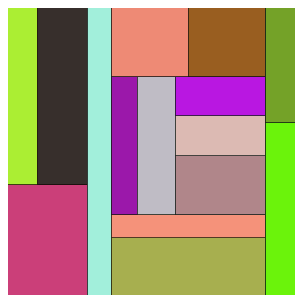

In [15]:
import pylab
from matplotlib.patches import Rectangle
class Treemap:
    def __init__(self, tree, iter_method, size_method, color_method):
        """create a tree map from tree, using itermethod(node) to walk tree,
        size_method(node) to get object size and color_method(node) to get its 
        color"""

        self.ax = pylab.subplot(111,aspect='equal')
        pylab.subplots_adjust(left=0, right=1, top=1, bottom=0)
        self.ax.set_xticks([])
        self.ax.set_yticks([])

        self.size_method = size_method
        self.iter_method = iter_method
        self.color_method = color_method
        self.addnode(tree)

    def addnode(self, node, lower=[0,0], upper=[1,1], axis=0):
        axis = axis % 2
        self.draw_rectangle(lower, upper, node)
        width = upper[axis] - lower[axis]
        try:
            for child in self.iter_method(node):
                upper[axis] = lower[axis] + (width * float(size(child))) / size(node)
                self.addnode(child, list(lower), list(upper), axis + 1)
                lower[axis] = upper[axis]

        except TypeError:
            pass

    def draw_rectangle(self, lower, upper, node):
        print lower, upper
        r = Rectangle( lower, upper[0]-lower[0], upper[1] - lower[1],
                   edgecolor='k',
                   facecolor= self.color_method(node))
        self.ax.add_patch(r)


if __name__ == '__main__':
    # example using nested lists, iter to walk and random colors

    size_cache = {}
    def size(thing):
        if isinstance(thing, int):
            return thing
        if thing in size_cache:
            return size_cache[thing]
        else:
            size_cache[thing] = reduce(int.__add__, [size(x) for x in thing])
            return size_cache[thing]
    import random
    def random_color(thing):
        return (random.random(),random.random(),random.random())
    
tree= ((5,(3,5)), 4, (5,2,(2,3,(3,2,2)),(3,3)), (3,2) )
Treemap(tree, iter, size, random_color)
pylab.show()